<br> <font color=blue> <font size=6><b>DECISION TREE:  </b>

<b> <font color='red' size=5> Business Problem:  </b> <br>
    <b>A cloth manufacturing company is interested to know about the segment or attributes causes high sale </b>

Company Data: 

In [1]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
%matplotlib inline
import seaborn as sns
import warnings
warnings.filterwarnings('ignore')

In [2]:
df= pd.read_csv("Company_Data.csv")

In [3]:
df

,Sales,CompPrice,Income,Advertising,Population,Price,ShelveLoc,Age,Education,Urban,US
0,9.50,138,73,11,276,120,Bad,42,17,Yes,Yes
1,11.22,111,48,16,260,83,Good,65,10,Yes,Yes
2,10.06,113,35,10,269,80,Medium,59,12,Yes,Yes
3,7.40,117,100,4,466,97,Medium,55,14,Yes,Yes
4,4.15,141,64,3,340,128,Bad,38,13,Yes,No
...,...,...,...,...,...,...,...,...,...,...,...
395,12.57,138,108,17,203,128,Good,33,14,Yes,Yes
396,6.14,139,23,3,37,120,Medium,55,11,No,Yes
397,7.41,162,26,12,368,159,Medium,40,18,Yes,Yes
398,5.94,100,79,7,284,95,Bad,50,12,Yes,Yes


In [4]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 400 entries, 0 to 399
Data columns (total 11 columns):
 #   Column       Non-Null Count  Dtype  
---  ------       --------------  -----  
 0   Sales        400 non-null    float64
 1   CompPrice    400 non-null    int64  
 2   Income       400 non-null    int64  
 3   Advertising  400 non-null    int64  
 4   Population   400 non-null    int64  
 5   Price        400 non-null    int64  
 6   ShelveLoc    400 non-null    object 
 7   Age          400 non-null    int64  
 8   Education    400 non-null    int64  
 9   Urban        400 non-null    object 
 10  US           400 non-null    object 
dtypes: float64(1), int64(7), object(3)
memory usage: 34.5+ KB


In [5]:
df.isnull().sum()

Sales          0
CompPrice      0
Income         0
Advertising    0
Population     0
Price          0
ShelveLoc      0
Age            0
Education      0
Urban          0
US             0
dtype: int64

In [6]:
df[df.duplicated()]

,Sales,CompPrice,Income,Advertising,Population,Price,ShelveLoc,Age,Education,Urban,US


In [7]:
df.describe().T

,count,mean,std,min,25%,50%,75%,max
Sales,400.0,7.496325,2.824115,0.0,5.39,7.49,9.32,16.27
CompPrice,400.0,124.975000,15.334512,77.0,115.00,125.00,135.00,175.00
Income,400.0,68.657500,27.986037,21.0,42.75,69.00,91.00,120.00
Advertising,400.0,6.635000,6.650364,0.0,0.00,5.00,12.00,29.00
Population,400.0,264.840000,147.376436,10.0,139.00,272.00,398.50,509.00
Price,400.0,115.795000,23.676664,24.0,100.00,117.00,131.00,191.00
Age,400.0,53.322500,16.200297,25.0,39.75,54.50,66.00,80.00
Education,400.0,13.900000,2.620528,10.0,12.00,14.00,16.00,18.00


<AxesSubplot:xlabel='Sales'>

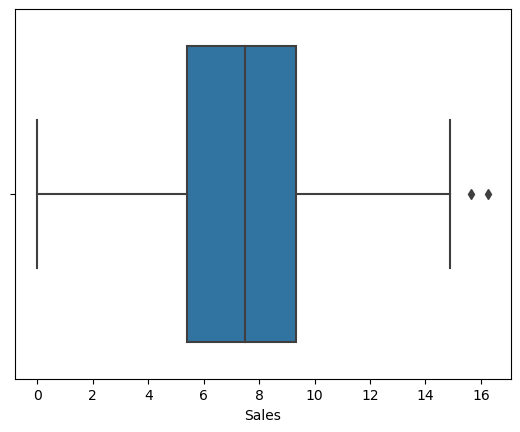

In [8]:
sns.boxplot(df['Sales'])

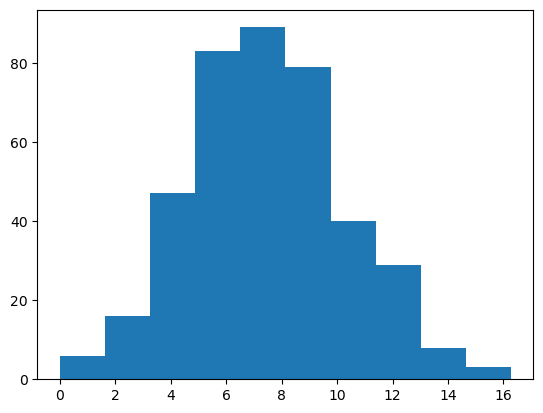

In [9]:
plt.hist('Sales', data=df)
plt.show()

Skewness:  0.18556036318721578
Kurtosis:  -0.08087736743346197


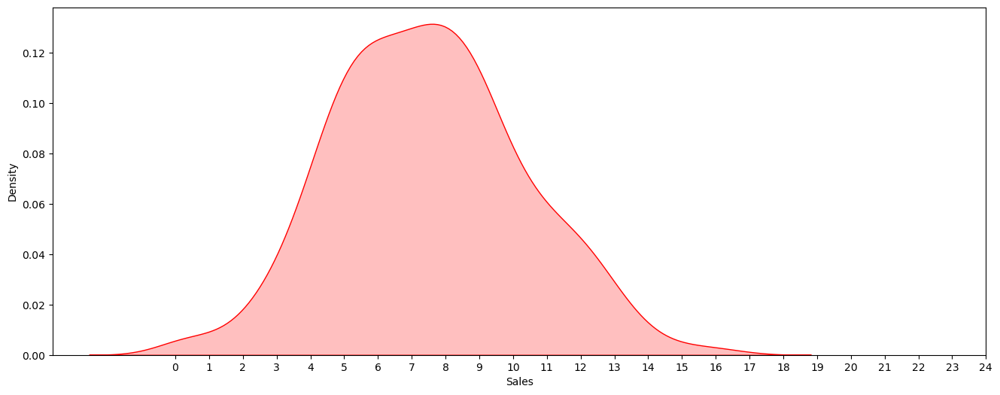

In [10]:
plt.figure(figsize=(16,6))
print("Skewness: ", df['Sales'].skew())
print("Kurtosis: ", df['Sales'].kurtosis())

graph = sns.kdeplot(df['Sales'], shade=True, color='red')
plt.xticks([i for i in range(0,25)])
plt.show()

In [11]:
df['Sales'].describe()

count    400.000000
mean       7.496325
std        2.824115
min        0.000000
25%        5.390000
50%        7.490000
75%        9.320000
max       16.270000
Name: Sales, dtype: float64

Dividing sales into 3 categorical values, "Low", "Medium", "High" into new column as "sales_cat".

In [12]:
df1 = df.copy()
df1['sales_cat'] = pd.cut(x=df1['Sales'], bins=[0,5.39,7.4,20], labels=["low", 'medium', 'high'])
df1.head()

,Sales,CompPrice,Income,Advertising,Population,Price,ShelveLoc,Age,Education,Urban,US,sales_cat
0,9.50,138,73,11,276,120,Bad,42,17,Yes,Yes,high
1,11.22,111,48,16,260,83,Good,65,10,Yes,Yes,high
2,10.06,113,35,10,269,80,Medium,59,12,Yes,Yes,high
3,7.40,117,100,4,466,97,Medium,55,14,Yes,Yes,medium
4,4.15,141,64,3,340,128,Bad,38,13,Yes,No,low


In [13]:
df1.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 400 entries, 0 to 399
Data columns (total 12 columns):
 #   Column       Non-Null Count  Dtype   
---  ------       --------------  -----   
 0   Sales        400 non-null    float64 
 1   CompPrice    400 non-null    int64   
 2   Income       400 non-null    int64   
 3   Advertising  400 non-null    int64   
 4   Population   400 non-null    int64   
 5   Price        400 non-null    int64   
 6   ShelveLoc    400 non-null    object  
 7   Age          400 non-null    int64   
 8   Education    400 non-null    int64   
 9   Urban        400 non-null    object  
 10  US           400 non-null    object  
 11  sales_cat    399 non-null    category
dtypes: category(1), float64(1), int64(7), object(3)
memory usage: 35.0+ KB


In [14]:
df1['sales_cat'].value_counts()

high      206
low        99
medium     94
Name: sales_cat, dtype: int64

Text(0.5, 1.0, 'Distribution of Sales')

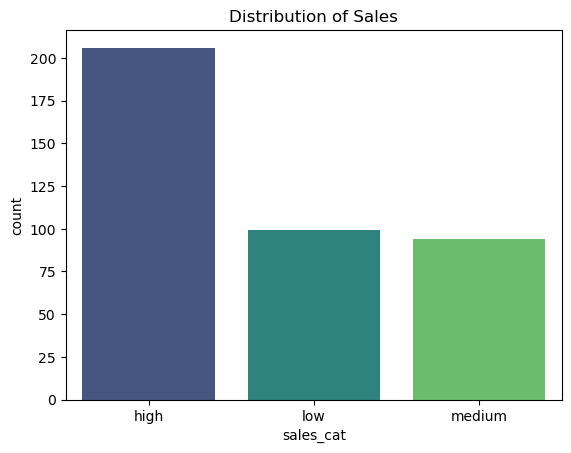

In [15]:
sns.countplot(x='sales_cat', data=df1, palette='viridis',
             order=df1['sales_cat'].value_counts().index)

plt.xticks(fontsize=10)
plt.title("Distribution of Sales")

In [16]:
cat_feature = df1.describe(include=['object','category']).columns
cat_feature

Index(['ShelveLoc', 'Urban', 'US', 'sales_cat'], dtype='object')

In [17]:
num_feature = df1.describe(include=['int64', 'float64']).columns
num_feature

Index(['Sales', 'CompPrice', 'Income', 'Advertising', 'Population', 'Price',
       'Age', 'Education'],
      dtype='object')

Univariate Plotting (Analysing numerical features: )

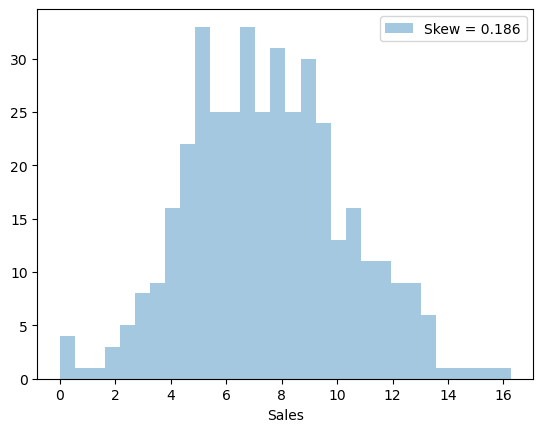

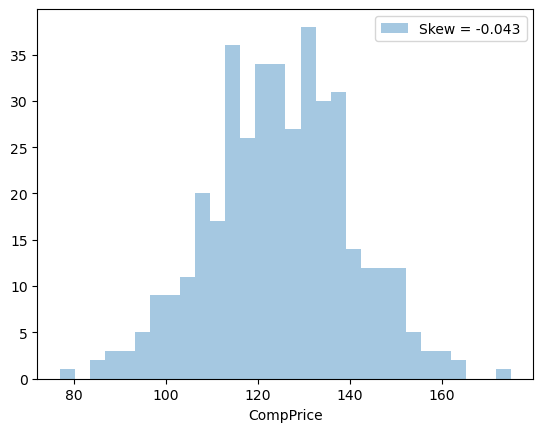

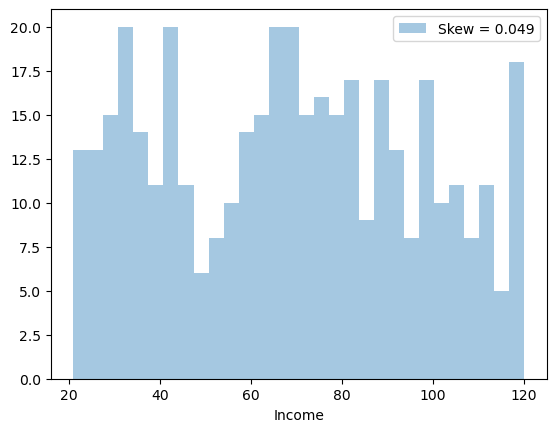

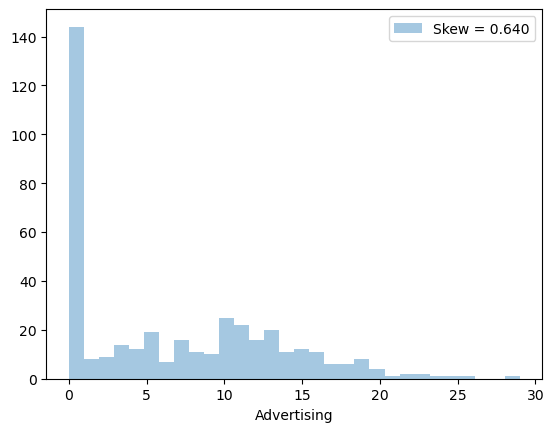

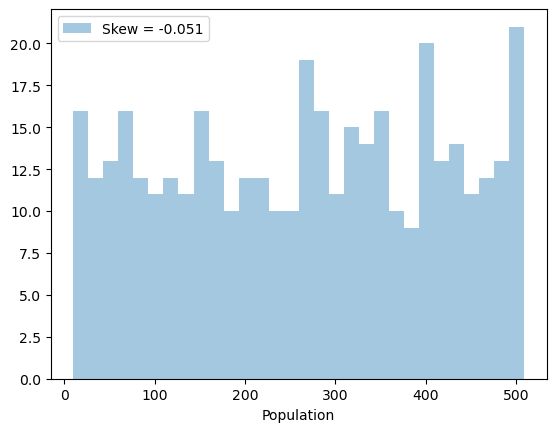

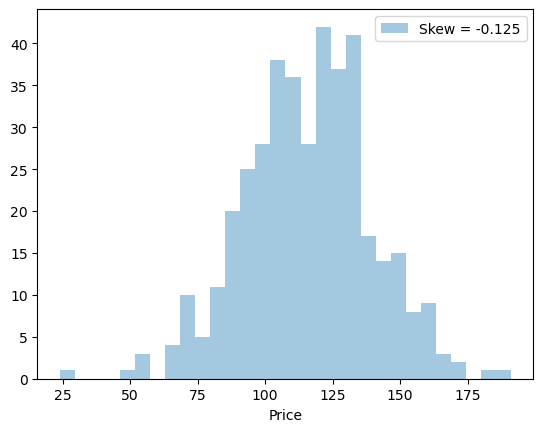

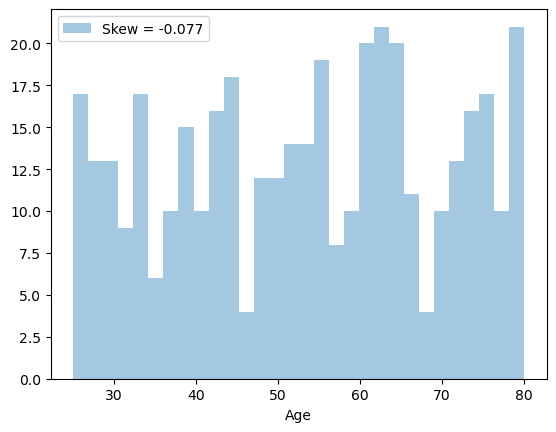

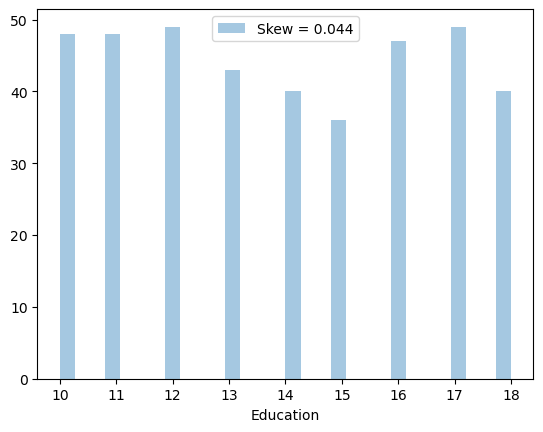

In [18]:
for i in num_feature:
    skew = df[i].skew()
    sns.distplot(df[i], kde=False, label='Skew = %.3f'%(skew), bins=30)
    plt.legend(loc='best')
    plt.show()

Outlier Detection: 

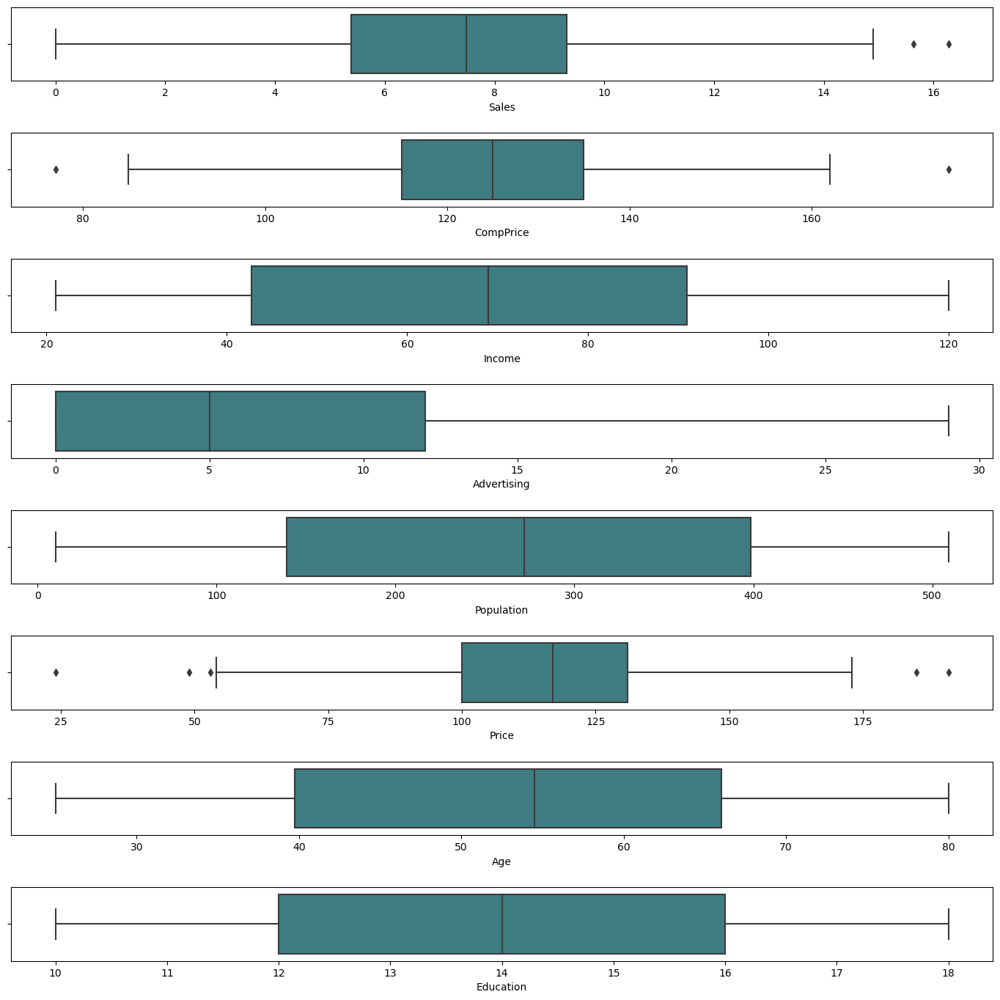

In [19]:
fig, axes=plt.subplots(8,1, figsize=(14,14), sharex=False, sharey=False)
sns.boxplot(x='Sales', data=df, palette='crest', ax=axes[0])
sns.boxplot(x='CompPrice', data=df, palette='crest', ax=axes[1])
sns.boxplot(x='Income', data=df, palette='crest', ax=axes[2])
sns.boxplot(x='Advertising', data=df, palette='crest', ax=axes[3])
sns.boxplot(x='Population', data=df, palette='crest', ax=axes[4])
sns.boxplot(x='Price', data=df, palette='crest', ax=axes[5])
sns.boxplot(x='Age', data=df, palette='crest', ax=axes[6])
sns.boxplot(x='Education', data=df, palette='crest', ax=axes[7])
plt.tight_layout(pad=2.0)



Multivariate Analysis: 

<Figure size 800x800 with 0 Axes>

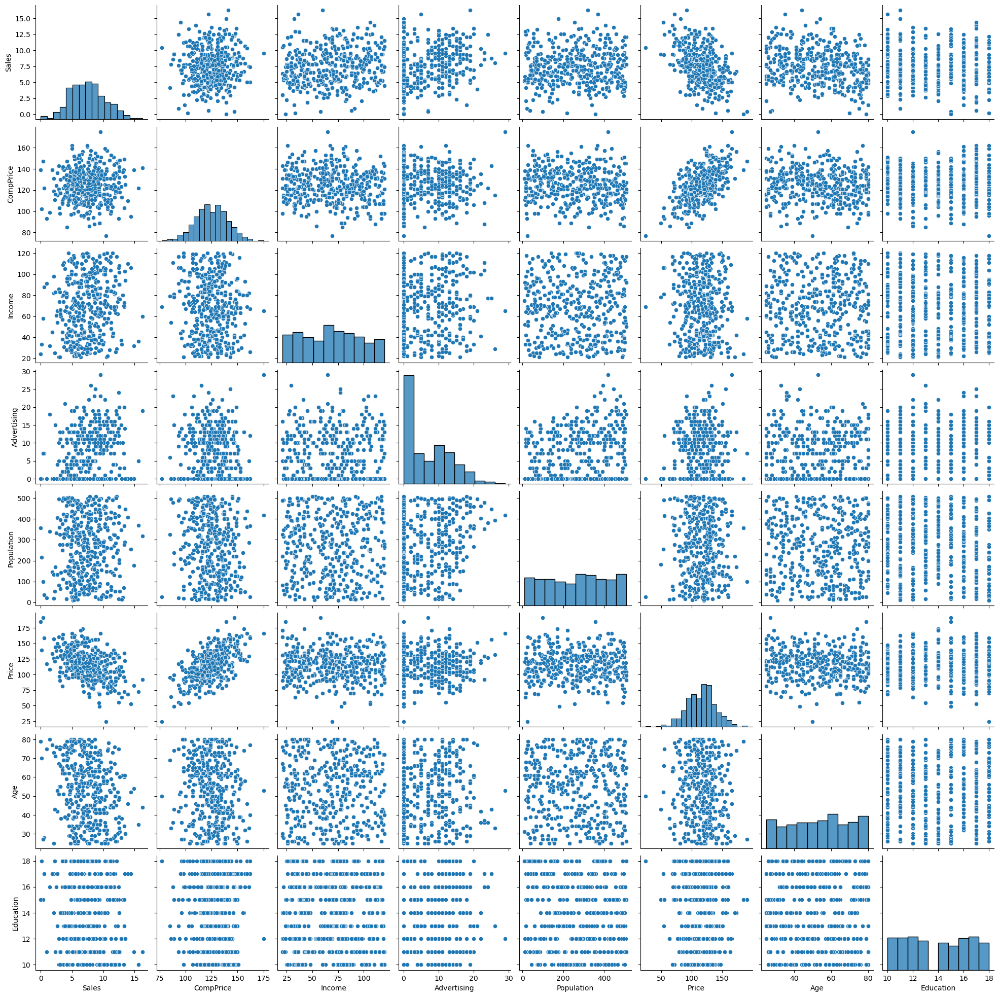

In [20]:
plt.figure(figsize=(8,8))
sns.pairplot(df, palette='coolwarm')
plt.show()

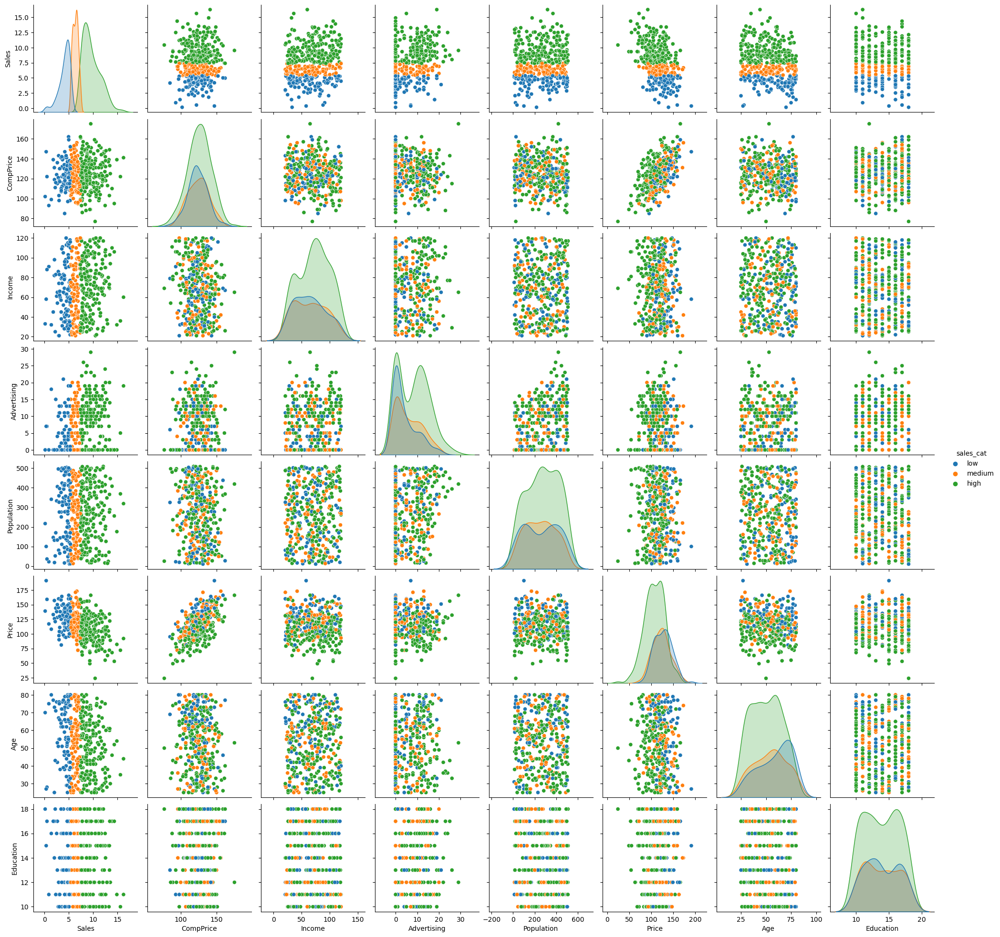

In [21]:
sns.pairplot(data=df1, hue='sales_cat')

Correlation between independent features and dependent feature

<AxesSubplot:>

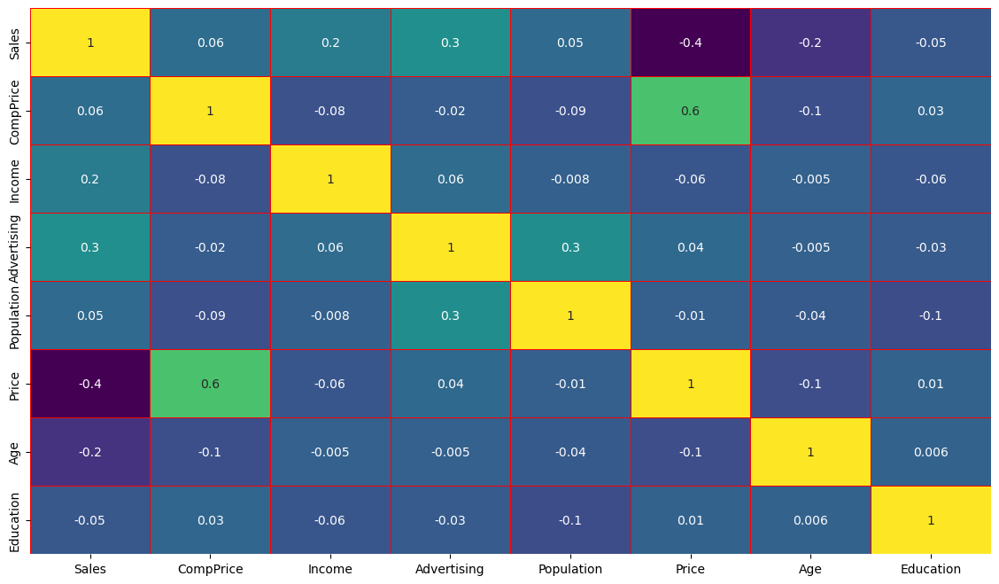

In [22]:
fig, ax = plt.subplots(figsize=(14,8))
sns.heatmap(df.corr(), annot=True, fmt='.1g', cmap="viridis", cbar=False, linewidths=0.5, linecolor='red')

In [23]:
data = df1.copy()
data.drop('Sales', axis=1, inplace=True)
data = pd.get_dummies(data.iloc[:,:-1])
data.head()

,CompPrice,Income,Advertising,Population,Price,Age,Education,ShelveLoc_Bad,ShelveLoc_Good,ShelveLoc_Medium,Urban_No,Urban_Yes,US_No,US_Yes
0,138,73,11,276,120,42,17,1,0,0,0,1,0,1
1,111,48,16,260,83,65,10,0,1,0,0,1,0,1
2,113,35,10,269,80,59,12,0,0,1,0,1,0,1
3,117,100,4,466,97,55,14,0,0,1,0,1,0,1
4,141,64,3,340,128,38,13,1,0,0,0,1,1,0


Text(0.5, 1.0, 'Correlation with Sales \n')

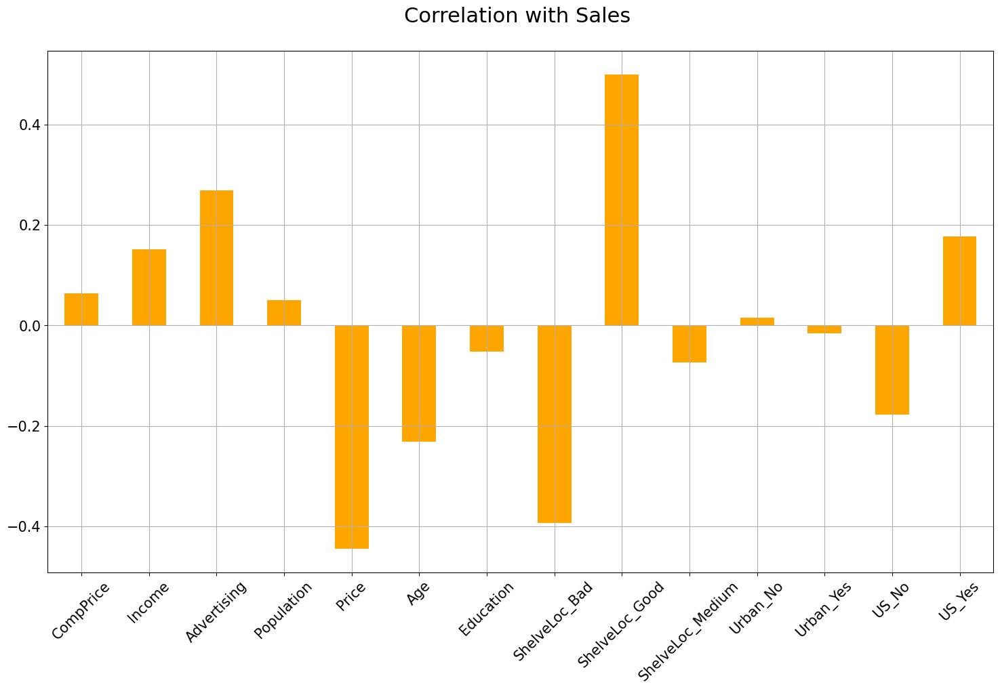

In [24]:
correlations = data.corrwith(df1.Sales)
correlations = correlations[correlations!=1]
positive_correlations = correlations[correlations>0].sort_values(ascending = False)
negative_correlations =correlations[correlations<0].sort_values(ascending = False)

correlations.plot.bar(
        figsize = (18, 10), 
        fontsize = 15, 
        color = 'orange',
        rot = 45, grid = True)
plt.title('Correlation with Sales \n',
horizontalalignment="center", fontstyle = "normal", 
fontsize = "22", fontfamily = "sans-serif")

In [25]:
df1.head()

,Sales,CompPrice,Income,Advertising,Population,Price,ShelveLoc,Age,Education,Urban,US,sales_cat
0,9.50,138,73,11,276,120,Bad,42,17,Yes,Yes,high
1,11.22,111,48,16,260,83,Good,65,10,Yes,Yes,high
2,10.06,113,35,10,269,80,Medium,59,12,Yes,Yes,high
3,7.40,117,100,4,466,97,Medium,55,14,Yes,Yes,medium
4,4.15,141,64,3,340,128,Bad,38,13,Yes,No,low


<AxesSubplot:ylabel='None'>

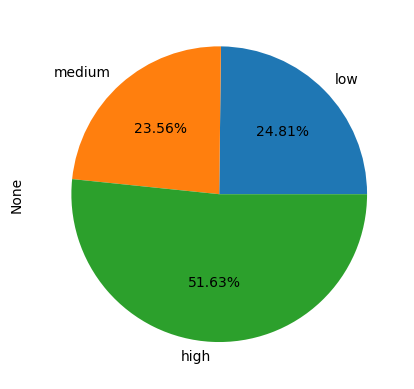

In [26]:
df1.groupby('sales_cat').size().plot(kind='pie', autopct='%.2f%%')

In [27]:
data.head()

,CompPrice,Income,Advertising,Population,Price,Age,Education,ShelveLoc_Bad,ShelveLoc_Good,ShelveLoc_Medium,Urban_No,Urban_Yes,US_No,US_Yes
0,138,73,11,276,120,42,17,1,0,0,0,1,0,1
1,111,48,16,260,83,65,10,0,1,0,0,1,0,1
2,113,35,10,269,80,59,12,0,0,1,0,1,0,1
3,117,100,4,466,97,55,14,0,0,1,0,1,0,1
4,141,64,3,340,128,38,13,1,0,0,0,1,1,0


Feature Selection Technique: 

Data Preprocessing: 

In [28]:
from dataprep.eda import plot, plot_correlation, plot_missing, create_report
from sklearn.preprocessing import StandardScaler, LabelEncoder
from sklearn.metrics import f1_score, precision_score, recall_score, classification_report,confusion_matrix,accuracy_score, roc_auc_score, roc_curve, precision_recall_curve
from sklearn.model_selection import GridSearchCV, KFold, StratifiedKFold, cross_val_score, train_test_split, RandomizedSearchCV
from collections import Counter

In [29]:
from imblearn.over_sampling import SMOTE,  ADASYN
from imblearn.combine import SMOTETomek, SMOTEENN
from imblearn.under_sampling import RandomUnderSampler
from imblearn.pipeline import Pipeline

In [30]:
data1 = df1.copy()
data1.drop('Sales', axis=1, inplace=True)
data1=pd.get_dummies(data1.iloc[:,:-1])
data1.head()

,CompPrice,Income,Advertising,Population,Price,Age,Education,ShelveLoc_Bad,ShelveLoc_Good,ShelveLoc_Medium,Urban_No,Urban_Yes,US_No,US_Yes
0,138,73,11,276,120,42,17,1,0,0,0,1,0,1
1,111,48,16,260,83,65,10,0,1,0,0,1,0,1
2,113,35,10,269,80,59,12,0,0,1,0,1,0,1
3,117,100,4,466,97,55,14,0,0,1,0,1,0,1
4,141,64,3,340,128,38,13,1,0,0,0,1,1,0


In [31]:
data1['sales'] = df1.sales_cat
data1.head()

,CompPrice,Income,Advertising,Population,Price,Age,Education,ShelveLoc_Bad,ShelveLoc_Good,ShelveLoc_Medium,Urban_No,Urban_Yes,US_No,US_Yes,sales
0,138,73,11,276,120,42,17,1,0,0,0,1,0,1,high
1,111,48,16,260,83,65,10,0,1,0,0,1,0,1,high
2,113,35,10,269,80,59,12,0,0,1,0,1,0,1,high
3,117,100,4,466,97,55,14,0,0,1,0,1,0,1,medium
4,141,64,3,340,128,38,13,1,0,0,0,1,1,0,low


In [32]:
from sklearn.preprocessing import OrdinalEncoder

In [33]:
data1['sales'].replace(['low','medium','high'], [0,1,2], inplace=True)

In [34]:
data1.head()

,CompPrice,Income,Advertising,Population,Price,Age,Education,ShelveLoc_Bad,ShelveLoc_Good,ShelveLoc_Medium,Urban_No,Urban_Yes,US_No,US_Yes,sales
0,138,73,11,276,120,42,17,1,0,0,0,1,0,1,2
1,111,48,16,260,83,65,10,0,1,0,0,1,0,1,2
2,113,35,10,269,80,59,12,0,0,1,0,1,0,1,2
3,117,100,4,466,97,55,14,0,0,1,0,1,0,1,1
4,141,64,3,340,128,38,13,1,0,0,0,1,1,0,0


In [35]:
data1.isnull().sum()

CompPrice           0
Income              0
Advertising         0
Population          0
Price               0
Age                 0
Education           0
ShelveLoc_Bad       0
ShelveLoc_Good      0
ShelveLoc_Medium    0
Urban_No            0
Urban_Yes           0
US_No               0
US_Yes              0
sales               1
dtype: int64

In [36]:
data1.dropna(inplace=True)

In [37]:
data1.isnull().sum()

CompPrice           0
Income              0
Advertising         0
Population          0
Price               0
Age                 0
Education           0
ShelveLoc_Bad       0
ShelveLoc_Good      0
ShelveLoc_Medium    0
Urban_No            0
Urban_Yes           0
US_No               0
US_Yes              0
sales               0
dtype: int64

In [38]:
x = data1.iloc[:,:-1]

y = data1.sales

In [39]:
x

,CompPrice,Income,Advertising,Population,Price,Age,Education,ShelveLoc_Bad,ShelveLoc_Good,ShelveLoc_Medium,Urban_No,Urban_Yes,US_No,US_Yes
0,138,73,11,276,120,42,17,1,0,0,0,1,0,1
1,111,48,16,260,83,65,10,0,1,0,0,1,0,1
2,113,35,10,269,80,59,12,0,0,1,0,1,0,1
3,117,100,4,466,97,55,14,0,0,1,0,1,0,1
4,141,64,3,340,128,38,13,1,0,0,0,1,1,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
395,138,108,17,203,128,33,14,0,1,0,0,1,0,1
396,139,23,3,37,120,55,11,0,0,1,1,0,0,1
397,162,26,12,368,159,40,18,0,0,1,0,1,0,1
398,100,79,7,284,95,50,12,1,0,0,0,1,0,1


In [40]:
y

0      2
1      2
2      2
3      1
4      0
      ..
395    2
396    1
397    2
398    1
399    2
Name: sales, Length: 399, dtype: category
Categories (3, int64): [0 < 1 < 2]

In [41]:
#Feature importance

from numpy import set_printoptions
from sklearn.feature_selection import SelectKBest, chi2

In [42]:
test = SelectKBest(score_func=chi2, k=4)
fit = test.fit(x,y)

In [43]:
scores = fit.scores_

features = fit.transform(x)

In [44]:
score_df = pd.DataFrame(list(zip(scores, x.columns)),
                       columns = ['score', 'features'])

score_df.sort_values(by='score', ascending=False, inplace=True)
score_df

,score,features
4,274.517509,Price
2,168.525291,Advertising
3,142.810342,Population
5,89.887369,Age
1,73.079068,Income
7,46.091952,ShelveLoc_Bad
8,41.615214,ShelveLoc_Good
12,5.349543,US_No
9,5.335149,ShelveLoc_Medium
0,3.284345,CompPrice


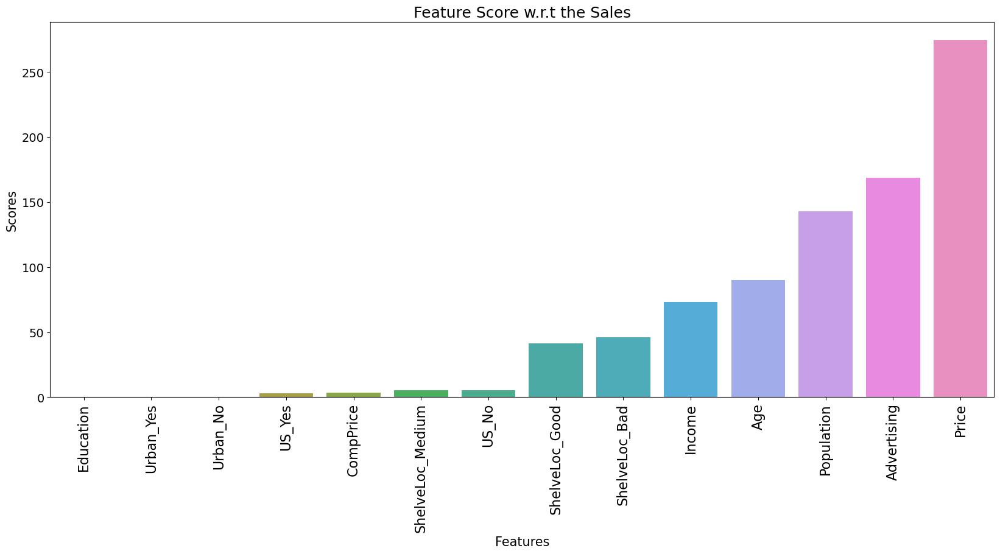

In [45]:
plt.figure(figsize=(20,8))
# make barplot and sort bars
sns.barplot(x='features',
            y="score", 
            data=score_df, 
            order=score_df.sort_values('score').features)
# set labels
plt.xlabel("Features", size=15)
plt.ylabel("Scores", size=15)
plt.yticks(rotation = 0, fontsize = 14)
plt.xticks(rotation = 90, fontsize = 16)
plt.title("Feature Score w.r.t the Sales", size=18)
plt.show()


In [46]:
data1.columns

Index(['CompPrice', 'Income', 'Advertising', 'Population', 'Price', 'Age',
       'Education', 'ShelveLoc_Bad', 'ShelveLoc_Good', 'ShelveLoc_Medium',
       'Urban_No', 'Urban_Yes', 'US_No', 'US_Yes', 'sales'],
      dtype='object')

In [47]:
model_data = data1[['Price', 'Advertising','Population', 'Income', 'Age', 'ShelveLoc_Good', 'ShelveLoc_Bad', 'ShelveLoc_Medium','sales']]
model_data.head()

,Price,Advertising,Population,Income,Age,ShelveLoc_Good,ShelveLoc_Bad,ShelveLoc_Medium,sales
0,120,11,276,73,42,0,1,0,2
1,83,16,260,48,65,1,0,0,2
2,80,10,269,35,59,0,0,1,2
3,97,4,466,100,55,0,0,1,1
4,128,3,340,64,38,0,1,0,0


Model Developement: 

In [48]:
from sklearn.tree import  DecisionTreeClassifier
from sklearn import tree

In [49]:
x = model_data.drop('sales', axis=1)
y = model_data['sales']

In [50]:
y.unique()

[2, 1, 0]
Categories (3, int64): [0 < 1 < 2]

In [51]:
skf = StratifiedKFold(n_splits=10, shuffle=True, random_state=1)

for train_ix, test_ix in skf.split(x,y):
    train_X, test_X = x.iloc[train_ix], x.iloc[test_ix]
    train_y, test_y = y.iloc[train_ix], y.iloc[test_ix]
    
counter_train = Counter(train_y)
counter_test = Counter(test_y)

print("Training Data: ", counter_train)
print("Testing Data: ", counter_train)

Training Data:  Counter({2: 186, 0: 90, 1: 84})
Testing Data:  Counter({2: 186, 0: 90, 1: 84})


In [52]:
x_train,x_test,y_train,y_test = train_test_split(x,y,test_size=0.3,random_state=0,stratify=y)


In [53]:
counter_train = Counter(y_train)
counter_test = Counter(y_test)
print("Training data: ", counter_train)
print("Testing Data: ", counter_test)

Training data:  Counter({2: 144, 0: 69, 1: 66})
Testing Data:  Counter({2: 62, 0: 30, 1: 28})


In [54]:
print("Shape of X_train: ",x_train.shape)
print("Shape of X_test: ", x_test.shape)
print("Shape of y_train: ",y_train.shape)
print("Shape of y_test",y_test.shape)

Shape of X_train:  (279, 8)
Shape of X_test:  (120, 8)
Shape of y_train:  (279,)
Shape of y_test (120,)


In [55]:
model_entropy = DecisionTreeClassifier(criterion='entropy', random_state=0)
model_entropy.fit(x_train, y_train)

DecisionTreeClassifier(criterion='entropy', random_state=0)

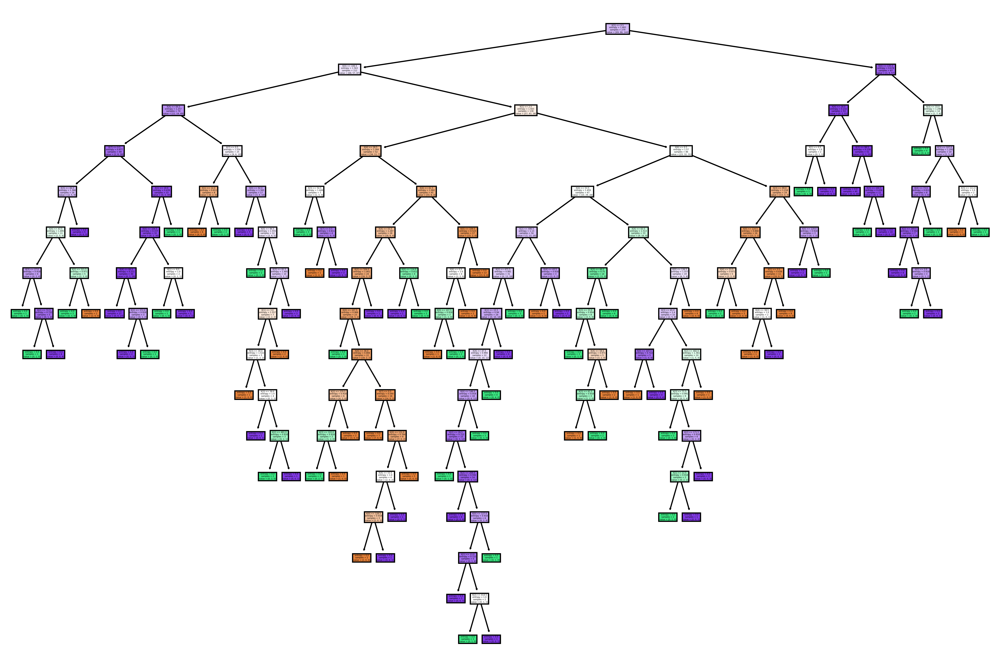

In [56]:
plt.figure(figsize=(15,10),dpi=500)
tree.plot_tree(model_entropy,filled=True)
plt.show()


In [57]:
pred_train = model_entropy.predict(x_train)

In [58]:
accuracy_score(y_train, pred_train)

1.0

In [59]:
pred_test = model_entropy.predict(x_test)

In [60]:
accuracy_score(y_test, pred_test)

0.5666666666666667

In [61]:
# predicting on test data set 
preds = model_entropy.predict(x_test) 
pd.Series(preds).value_counts()

2    55
0    42
1    23
dtype: int64

In [62]:
print(classification_report(y_test,preds))

              precision    recall  f1-score   support

           0       0.43      0.60      0.50        30
           1       0.26      0.21      0.24        28
           2       0.80      0.71      0.75        62

    accuracy                           0.57       120
   macro avg       0.50      0.51      0.50       120
weighted avg       0.58      0.57      0.57       120



In [63]:
predictions = pd.DataFrame({"Actual":y_test, "Predicted":pred_test})

In [64]:
predictions

,Actual,Predicted
397,2,1
383,2,2
228,1,0
94,2,2
201,1,0
...,...,...
248,0,2
291,1,2
173,1,2
113,1,0


In [65]:
model_entropy.feature_importances_

array([0.23003021, 0.11328517, 0.10989619, 0.16086964, 0.20960579,
       0.08932532, 0.03737937, 0.04960831])

In [70]:
features = pd.DataFrame({'Feature': list(x_train.columns),
                   'Importance': model_entropy.feature_importances_}).sort_values('Importance', ascending = False)

In [71]:
features

,Feature,Importance
0,Price,0.230030
4,Age,0.209606
3,Income,0.160870
1,Advertising,0.113285
2,Population,0.109896
5,ShelveLoc_Good,0.089325
7,ShelveLoc_Medium,0.049608
6,ShelveLoc_Bad,0.037379


Grid Search using Stratified KFold Splits on imbalances DataSet

In [72]:
def print_score(clf, X_train, y_train, X_test, y_test, train=True):
    if train:
        pred = clf.predict(X_train)
        clf_report = pd.DataFrame(classification_report(y_train, pred, output_dict=True))
        print("Train Result:\n================================================")
        print(f"Accuracy Score: {accuracy_score(y_train, pred) * 100:.2f}%")
        print("_______________________________________________")
        print(f"CLASSIFICATION REPORT:\n{clf_report}")
        print("_______________________________________________")
        print(f"Confusion Matrix: \n {confusion_matrix(y_train, pred)}\n")
        
    elif train==False:
        pred = clf.predict(X_test)
        clf_report = pd.DataFrame(classification_report(y_test, pred, output_dict=True))
        print("Test Result:\n================================================")        
        print(f"Accuracy Score: {accuracy_score(y_test, pred) * 100:.2f}%")
        print("_______________________________________________")
        print(f"CLASSIFICATION REPORT:\n{clf_report}")
        print("_______________________________________________")
        print(f"Confusion Matrix: \n {confusion_matrix(y_test, pred)}\n")

In [73]:
params = {
    "criterion":("gini", "entropy"), 
    "splitter":("best", "random"), 
    "max_depth":(list(range(1, 20))), 
    "min_samples_split":[2, 3, 4], 
    "min_samples_leaf":list(range(1, 20)), 
}


tree_clf = DecisionTreeClassifier(random_state=42)
tree_cv = GridSearchCV(tree_clf, params, scoring="accuracy", n_jobs=-1, verbose=1, cv=3)
tree_cv.fit(train_X, train_y)
best_params = tree_cv.best_params_
print(f"Best paramters: {best_params})")

tree_clf = DecisionTreeClassifier(**best_params)
tree_clf.fit(train_X, train_y)
print_score(tree_clf, train_X, train_y, test_X, test_y, train=True)
print_score(tree_clf, train_X, train_y, test_X, test_y, train=False)

Fitting 3 folds for each of 4332 candidates, totalling 12996 fits
Best paramters: {'criterion': 'entropy', 'max_depth': 8, 'min_samples_leaf': 8, 'min_samples_split': 2, 'splitter': 'random'})
Train Result:
Accuracy Score: 69.17%
_______________________________________________
CLASSIFICATION REPORT:
                   0          1           2  accuracy   macro avg  \
precision   0.720000   0.474747    0.795699  0.691667    0.663482   
recall      0.600000   0.559524    0.795699  0.691667    0.651741   
f1-score    0.654545   0.513661    0.795699  0.691667    0.654635   
support    90.000000  84.000000  186.000000  0.691667  360.000000   

           weighted avg  
precision      0.701886  
recall         0.691667  
f1-score       0.694602  
support      360.000000  
_______________________________________________
Confusion Matrix: 
 [[ 54  22  14]
 [ 13  47  24]
 [  8  30 148]]

Test Result:
Accuracy Score: 53.85%
_______________________________________________
CLASSIFICATION REPORT:
 

In [74]:
# Get score for different values of n
decision_tree = DecisionTreeClassifier()
skf = StratifiedKFold(n_splits=10, shuffle=True, random_state=1)

results = cross_val_score(decision_tree, train_X, train_y, cv=skf)
print(results.mean())

0.5694444444444444


In [76]:
param_dict = {
    "criterion":["gini","entropy"],
    "max_depth":range(1,10),
    "min_samples_split":range(1,10),
    "min_samples_leaf":range(1,10)
}

grid = GridSearchCV(decision_tree,
                   param_grid = param_dict,
                   cv=skf,
                   verbose=1,
                    n_jobs=6)
grid.fit(train_X,train_y)

model = grid.best_estimator_

Fitting 10 folds for each of 1458 candidates, totalling 14580 fits


In [77]:
grid.best_score_

0.6138888888888888

In [78]:
predict_output = model.predict(test_X)
accuracy_test = accuracy_score(test_y,predict_output)
accuracy_test

0.6410256410256411

              precision    recall  f1-score   support

           0       0.56      0.56      0.56         9
           1       0.50      0.30      0.37        10
           2       0.71      0.85      0.77        20

    accuracy                           0.64        39
   macro avg       0.59      0.57      0.57        39
weighted avg       0.62      0.64      0.62        39



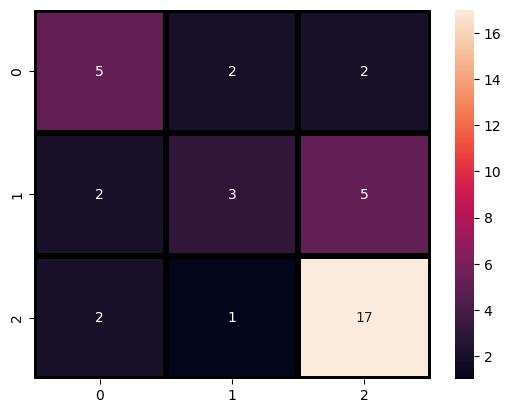

In [79]:
sns.heatmap(confusion_matrix(test_y, predict_output),annot=True,fmt = "d",linecolor="k",linewidths=3)
print(classification_report(test_y,predict_output))

Grid search using Train Test Splits Stritifying target feature on Imbalanced DataSet

In [80]:
params = {
    "criterion":("gini", "entropy"), 
    "splitter":("best", "random"), 
    "max_depth":(list(range(1, 20))), 
    "min_samples_split":[2, 3, 4], 
    "min_samples_leaf":list(range(1, 20)), 
}


tree_clf = DecisionTreeClassifier(random_state=42)
tree_cv = GridSearchCV(tree_clf, params, scoring="accuracy", n_jobs=-1, verbose=1, cv=3)
tree_cv.fit(x_train, y_train)
best_params = tree_cv.best_params_
print(f"Best paramters: {best_params})")

tree_clf = DecisionTreeClassifier(**best_params)
tree_clf.fit(x_train, y_train)
print_score(tree_clf, x_train, y_train, x_test, y_test, train=True)
print_score(tree_clf, x_train, y_train, x_test, y_test, train=False)

Fitting 3 folds for each of 4332 candidates, totalling 12996 fits
Best paramters: {'criterion': 'gini', 'max_depth': 7, 'min_samples_leaf': 8, 'min_samples_split': 2, 'splitter': 'random'})
Train Result:
Accuracy Score: 69.53%
_______________________________________________
CLASSIFICATION REPORT:
                   0          1           2  accuracy   macro avg  \
precision   0.657534   0.538462    0.766234  0.695341    0.654077   
recall      0.695652   0.424242    0.819444  0.695341    0.646446   
f1-score    0.676056   0.474576    0.791946  0.695341    0.647526   
support    69.000000  66.000000  144.000000  0.695341  279.000000   

           weighted avg  
precision      0.685469  
recall         0.695341  
f1-score       0.688209  
support      279.000000  
_______________________________________________
Confusion Matrix: 
 [[ 48   9  12]
 [ 14  28  24]
 [ 11  15 118]]

Test Result:
Accuracy Score: 62.50%
_______________________________________________
CLASSIFICATION REPORT:
    

In [81]:
# Get score for different values of n
decision_tree = DecisionTreeClassifier()
skf = StratifiedKFold(n_splits=10, shuffle=True, random_state=1)

results = cross_val_score(decision_tree, x_train, y_train, cv=skf)
print(results.mean())

0.5087301587301588


In [82]:
param_dict = {
    "criterion":["gini","entropy"],
    "max_depth":range(1,10),
    "min_samples_split":range(1,10),
    "min_samples_leaf":range(1,10)
}

grid = GridSearchCV(decision_tree,
                   param_grid = param_dict,
                   cv=skf,
                   verbose=1,
                   n_jobs=6)

grid.fit(x_train,y_train)

model = grid.best_estimator_

Fitting 10 folds for each of 1458 candidates, totalling 14580 fits


In [83]:
grid.best_score_

0.5978835978835979

In [84]:
predict_output = model.predict(x_test)
accuracy_test = accuracy_score(y_test,predict_output)
accuracy_test

0.5666666666666667

              precision    recall  f1-score   support

           0       0.46      0.77      0.57        30
           1       0.35      0.29      0.31        28
           2       0.79      0.60      0.68        62

    accuracy                           0.57       120
   macro avg       0.53      0.55      0.52       120
weighted avg       0.60      0.57      0.57       120



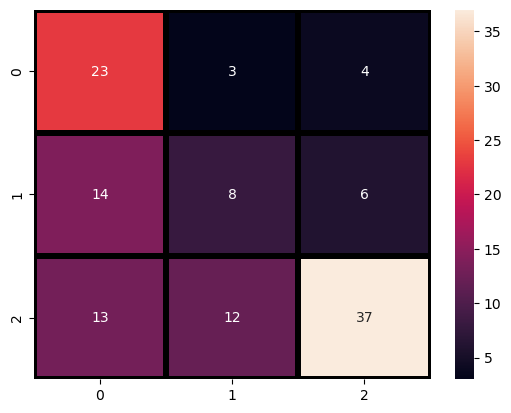

In [85]:
sns.heatmap(confusion_matrix(y_test, predict_output),annot=True,fmt = "d",linecolor="k",linewidths=3)
print(classification_report(y_test,predict_output))

In both the cases, we had imbalanced dataset and our results are getting biased towards the majority.
The model is correctly classifying all the majority classes but yet fails to classify the minority classes.<br>
SO we need to use some more kind of oversampling techniques to balance the dataset.

Handling imbalanced data uing SMOTE based techniques: 

In [86]:
x 

,Price,Advertising,Population,Income,Age,ShelveLoc_Good,ShelveLoc_Bad,ShelveLoc_Medium
0,120,11,276,73,42,0,1,0
1,83,16,260,48,65,1,0,0
2,80,10,269,35,59,0,0,1
3,97,4,466,100,55,0,0,1
4,128,3,340,64,38,0,1,0
...,...,...,...,...,...,...,...,...
395,128,17,203,108,33,1,0,0
396,120,3,37,23,55,0,0,1
397,159,12,368,26,40,0,0,1
398,95,7,284,79,50,0,1,0


In [87]:
y

0      2
1      2
2      2
3      1
4      0
      ..
395    2
396    1
397    2
398    1
399    2
Name: sales, Length: 399, dtype: category
Categories (3, int64): [0 < 1 < 2]

In [88]:
x_train, x_test, y_train, y_test = train_test_split( x, y, test_size=0.30, random_state=0,stratify=y)


SMOTE Oversmpling technique: 

In [89]:
counter = Counter(y_train)
print('Before',counter)
# oversampling the train dataset using SMOTE
smt = SMOTE()
x_train_sm, y_train_sm = smt.fit_resample(x_train, y_train)

counter = Counter(y_train_sm)
print('After',counter)

Before Counter({2: 144, 0: 69, 1: 66})
After Counter({0: 144, 2: 144, 1: 144})


ADASYN: Adaptive Synthetic Sampling: 

In [90]:
counter = Counter(y_train)
print('Before',counter)
# oversampling the train dataset using ADASYN
ada = ADASYN(random_state=130)
x_train_ada, y_train_ada = ada.fit_resample(x_train, y_train)

counter = Counter(y_train_ada)
print('After',counter)

Before Counter({2: 144, 0: 69, 1: 66})
After Counter({1: 148, 0: 147, 2: 144})


SMOTE + Tomek Links: 

In [91]:
counter = Counter(y_train)
print('Before',counter)
# oversampling the train dataset using SMOTE + Tomek
smtom = SMOTETomek(random_state=139)
x_train_smtom, y_train_smtom = smtom.fit_resample(x_train, y_train)

counter = Counter(y_train_smtom)
print('After',counter)

Before Counter({2: 144, 0: 69, 1: 66})
After Counter({0: 132, 1: 128, 2: 120})


SMOTE + ENN

In [92]:
counter = Counter(y_train)
print('Before',counter)
#oversampling the train dataset using SMOTE + ENN
smenn = SMOTEENN()
x_train_smenn, y_train_smenn = smenn.fit_resample(x_train, y_train)

counter = Counter(y_train_smenn)
print('After',counter)

Before Counter({2: 144, 0: 69, 1: 66})
After Counter({1: 68, 0: 66, 2: 28})


Performance Analysis of each Resampling: 

In [93]:
sampled_data = {
    'ACTUAL':[x_train, y_train],
    'SMOTE':[x_train_sm, y_train_sm],
    'ADASYN':[x_train_ada, y_train_ada],
    'SMOTE_TOMEK':[x_train_smtom, y_train_smtom],
    'SMOTE_ENN':[x_train_smenn, y_train_smenn]
}

In [94]:
def test_eval(clf_model, X_test, y_test, algo=None, sampling=None):
    # Test set prediction
    y_prob=clf_model.predict_proba(X_test)
    y_pred=clf_model.predict(X_test)

    print('Confusion Matrix')
    print('='*60)
    #plot_confusion_matrix(clf_model, X_test, y_test)  
    #plt.show() 
    print(confusion_matrix(y_test,y_pred),"\n")
    print('Classification Report')
    print('='*60)
    print(classification_report(y_test,y_pred),"\n")
    #print('AUC-ROC')
    #print('='*60)
    #print(roc_auc_score(y_test, y_prob[:,1], multi_class='ovo'))
    
    #x = roc_auc_score(y_test, y_prob[:,1])
    f1 = f1_score(y_test, y_pred, average='micro')
    recall = recall_score(y_test, y_pred, average='micro')
    precision = precision_score(y_test, y_pred, average='micro')
          
    
    return algo,precision,recall,f1,sampling

In [95]:
model_params = {
    'decision_tree' :{
        'model' :  DecisionTreeClassifier(),
        'params' : {
             'max_depth': [i for i in range(5,16,2)],
             'min_samples_split': [2, 5, 10, 15, 20, 50, 100],
             'min_samples_leaf': [1, 2, 5],
             'criterion': ['gini', 'entropy'],
             'max_features': ['log2', 'sqrt', 'auto']
        }
        
    }
    
}

In [96]:
cv = StratifiedKFold(n_splits=5, random_state=100, shuffle=True)
output = []
for model , model_hp in model_params.items():
    for resam , data in sampled_data.items():
        clf = RandomizedSearchCV(model_hp['model'], model_hp['params'],cv = cv, scoring='roc_auc', n_jobs=-1 )
        clf.fit(data[0], data[1])
        clf_best = clf.best_estimator_
        print('x'*60)
        print(model+' with ' + resam)
        print('='*60)
        output.append(test_eval(clf_best, x_test, y_test, model, resam))

xxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxx
decision_tree with ACTUAL
Confusion Matrix
[[19  3  8]
 [ 9  2 17]
 [13  4 45]] 

Classification Report
              precision    recall  f1-score   support

           0       0.46      0.63      0.54        30
           1       0.22      0.07      0.11        28
           2       0.64      0.73      0.68        62

    accuracy                           0.55       120
   macro avg       0.44      0.48      0.44       120
weighted avg       0.50      0.55      0.51       120
 

xxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxx
decision_tree with SMOTE
Confusion Matrix
[[22  2  6]
 [17  4  7]
 [20  6 36]] 

Classification Report
              precision    recall  f1-score   support

           0       0.37      0.73      0.49        30
           1       0.33      0.14      0.20        28
           2       0.73      0.58      0.65        62

    accuracy                           0.52       120
   macro avg    

After comapring the result, SMOTE TOMEK Hybridization technique is giving the best result.

In [97]:
counter = Counter(y)
print('Before',counter)
# oversampling the train dataset using SMOTE + Tomek
smtom = SMOTETomek(random_state=0)
x_train_smtom, y_train_smtom = smtom.fit_resample(x, y)

counter = Counter(y_train_smtom)
print('After',counter)

Before Counter({2: 206, 0: 99, 1: 94})
After Counter({1: 185, 0: 185, 2: 178})


In [98]:
x_train,x_test,y_train,y_test = train_test_split(x_train_smtom,y_train_smtom,test_size=0.3,random_state=0, stratify=y_train_smtom)

counter = Counter(y_train_smtom)
print('Before',counter)
counter = Counter(y_train)
print('After',counter)
print("Shape of X_train: ",x_train.shape)
print("Shape of X_test: ", x_test.shape)
print("Shape of y_train: ",y_train.shape)
print("Shape of y_test",y_test.shape)

Before Counter({1: 185, 0: 185, 2: 178})
After Counter({0: 129, 1: 129, 2: 125})
Shape of X_train:  (383, 8)
Shape of X_test:  (165, 8)
Shape of y_train:  (383,)
Shape of y_test (165,)


In [99]:
from sklearn.tree import DecisionTreeClassifier

In [100]:
model_entropy = DecisionTreeClassifier(criterion='entropy', random_state=0)
model_entropy.fit(x_train, y_train)

DecisionTreeClassifier(criterion='entropy', random_state=0)

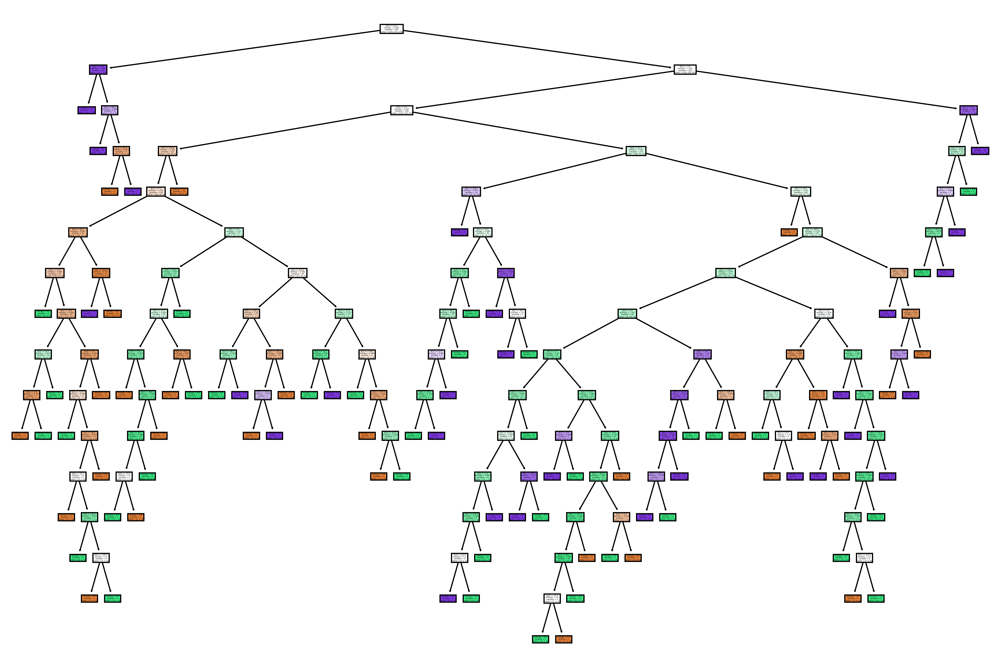

In [101]:
plt.figure(figsize=(15,10),dpi=500)
tree.plot_tree(model_entropy,filled=True)
plt.show()


In [102]:
pred_train = model_entropy.predict(x_train)

In [103]:
accuracy_score(y_train, pred_train)

1.0

In [104]:
pred_test = model_entropy.predict(x_test)

In [105]:
accuracy_score(y_test, pred_test)

0.6424242424242425

In [106]:
# predicting on test data set 
preds = model_entropy.predict(x_test) 
pd.Series(preds).value_counts()

1    71
2    49
0    45
dtype: int64

In [107]:
print(classification_report(y_test,preds))

              precision    recall  f1-score   support

           0       0.69      0.55      0.61        56
           1       0.54      0.68      0.60        56
           2       0.76      0.70      0.73        53

    accuracy                           0.64       165
   macro avg       0.66      0.64      0.65       165
weighted avg       0.66      0.64      0.64       165



In [108]:
predictions = pd.DataFrame({"Actual":y_test, "Predicted":pred_test})

In [109]:
predictions

,Actual,Predicted
32,2,2
69,0,0
377,0,0
165,1,2
489,1,1
...,...,...
50,0,1
197,1,1
305,1,2
131,1,1


In [110]:
model_entropy.feature_importances_

array([0.21823645, 0.14018038, 0.18907184, 0.12986664, 0.15674593,
       0.07699046, 0.03178972, 0.05711858])

In [111]:
features = pd.DataFrame({'Feature': list(x_train.columns),
                   'Importance': model_entropy.feature_importances_}).sort_values('Importance', ascending = False)

In [112]:
features

,Feature,Importance
0,Price,0.218236
2,Population,0.189072
4,Age,0.156746
1,Advertising,0.140180
3,Income,0.129867
5,ShelveLoc_Good,0.076990
7,ShelveLoc_Medium,0.057119
6,ShelveLoc_Bad,0.031790


In [113]:
df.head()

,Sales,CompPrice,Income,Advertising,Population,Price,ShelveLoc,Age,Education,Urban,US
0,9.50,138,73,11,276,120,Bad,42,17,Yes,Yes
1,11.22,111,48,16,260,83,Good,65,10,Yes,Yes
2,10.06,113,35,10,269,80,Medium,59,12,Yes,Yes
3,7.40,117,100,4,466,97,Medium,55,14,Yes,Yes
4,4.15,141,64,3,340,128,Bad,38,13,Yes,No
